# Optional Lab: Gradient Descent for Logistic Regression

## Goals
In this lab, you will:
- update gradient descent for logistic regression.
- explore gradient descent on a familiar data set

In [1]:
import copy, math
import numpy as np
%matplotlib widget
import matplotlib.pyplot as plt
from lab_utils_common import  dlc, plot_data, plt_tumor_data, sigmoid, compute_cost_logistic
from plt_quad_logistic import plt_quad_logistic, plt_prob
plt.style.use('./deeplearning.mplstyle')

## Data set 
Let's start with the same two feature data set used in the decision boundary lab.

In [2]:
X_train = np.array([[0.5, 1.5], [1,1], [1.5, 0.5], [3, 0.5], [2, 2], [1, 2.5]])
y_train = np.array([0, 0, 0, 1, 1, 1])

As before, we'll use a helper function to plot this data. The data points with label $y=1$ are shown as red crosses, while the data points with label $y=0$ are shown as blue circles.

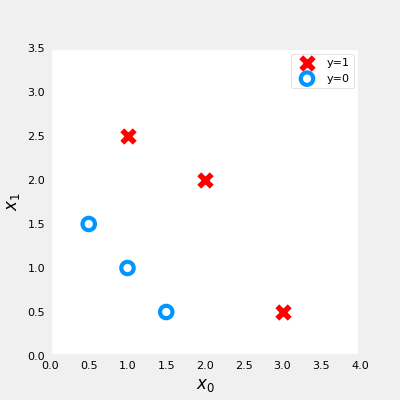

In [3]:
fig,ax = plt.subplots(1,1,figsize=(4,4))
plot_data(X_train, y_train, ax)

ax.axis([0, 4, 0, 3.5])
ax.set_ylabel('$x_1$', fontsize=12)
ax.set_xlabel('$x_0$', fontsize=12)
plt.show()

## Logistic Gradient Descent
<img align="right" src="./images/C1_W3_Logistic_gradient_descent.png"     style=" width:400px; padding: 10px; " >

Recall the gradient descent algorithm utilizes the gradient calculation:
$$\begin{align*}
&\text{repeat until convergence:} \; \lbrace \\
&  \; \; \;w_j = w_j -  \alpha \frac{\partial J(\mathbf{w},b)}{\partial w_j} \tag{1}  \; & \text{for j := 0..n-1} \\ 
&  \; \; \;  \; \;b = b -  \alpha \frac{\partial J(\mathbf{w},b)}{\partial b} \\
&\rbrace
\end{align*}$$

Where each iteration performs simultaneous updates on $w_j$ for all $j$, where
$$\begin{align*}
\frac{\partial J(\mathbf{w},b)}{\partial w_j}  &= \frac{1}{m} \sum\limits_{i = 0}^{m-1} (f_{\mathbf{w},b}(\mathbf{x}^{(i)}) - y^{(i)})x_{j}^{(i)} \tag{2} \\
\frac{\partial J(\mathbf{w},b)}{\partial b}  &= \frac{1}{m} \sum\limits_{i = 0}^{m-1} (f_{\mathbf{w},b}(\mathbf{x}^{(i)}) - y^{(i)}) \tag{3} 
\end{align*}$$

* m is the number of training examples in the data set      
* $f_{\mathbf{w},b}(x^{(i)})$ is the model's prediction, while $y^{(i)}$ is the target
* For a logistic regression model  
    $z = \mathbf{w} \cdot \mathbf{x} + b$  
    $f_{\mathbf{w},b}(x) = g(z)$  
    where $g(z)$ is the sigmoid function:  
    $g(z) = \frac{1}{1+e^{-z}}$   
    


### Gradient Descent Implementation
The gradient descent algorithm implementation has two components: 
- The loop implementing equation (1) above. This is `gradient_descent` below and is generally provided to you in optional and practice labs.
- The calculation of the current gradient, equations (2,3) above. This is `compute_gradient_logistic` below. You will be asked to implement this week's practice lab.

#### Calculating the Gradient, Code Description
Implements equation (2),(3) above for all $w_j$ and $b$.
There are many ways to implement this. Outlined below is this:
- initialize variables to accumulate `dj_dw` and `dj_db`
- for each example
    - calculate the error for that example $g(\mathbf{w} \cdot \mathbf{x}^{(i)} + b) - \mathbf{y}^{(i)}$
    - for each input value $x_{j}^{(i)}$ in this example,  
        - multiply the error by the input  $x_{j}^{(i)}$, and add to the corresponding element of `dj_dw`. (equation 2 above)
    - add the error to `dj_db` (equation 3 above)

- divide `dj_db` and `dj_dw` by total number of examples (m)
- note that $\mathbf{x}^{(i)}$ in numpy `X[i,:]` or `X[i]`  and $x_{j}^{(i)}$ is `X[i,j]`

In [4]:
def compute_gradient_logistic(X, y, w, b): 
    """
    Computes the gradient for linear regression 
 
    Args:
      X (ndarray (m,n): Data, m examples with n features
      y (ndarray (m,)): target values
      w (ndarray (n,)): model parameters  
      b (scalar)      : model parameter
    Returns
      dj_dw (ndarray (n,)): The gradient of the cost w.r.t. the parameters w. 
      dj_db (scalar)      : The gradient of the cost w.r.t. the parameter b. 
    """
    m,n = X.shape
    dj_dw = np.zeros((n,))                           #(n,)
    dj_db = 0.

    for i in range(m):
        f_wb_i = sigmoid(np.dot(X[i],w) + b)          #(n,)(n,)=scalar
        err_i  = f_wb_i  - y[i]                       #scalar
        for j in range(n):
            dj_dw[j] = dj_dw[j] + err_i * X[i,j]      #scalar
        dj_db = dj_db + err_i
    dj_dw = dj_dw/m                                   #(n,)
    dj_db = dj_db/m                                   #scalar
        
    return dj_db, dj_dw

Check the implementation of the gradient function using the cell below.

In [5]:
X_tmp = np.array([[0.5, 1.5], [1,1], [1.5, 0.5], [3, 0.5], [2, 2], [1, 2.5]])
y_tmp = np.array([0, 0, 0, 1, 1, 1])
w_tmp = np.array([2.,3.])
b_tmp = 1.
dj_db_tmp, dj_dw_tmp = compute_gradient_logistic(X_tmp, y_tmp, w_tmp, b_tmp)
print(f"dj_db: {dj_db_tmp}" )
print(f"dj_dw: {dj_dw_tmp.tolist()}" )

dj_db: 0.49861806546328574
dj_dw: [0.498333393278696, 0.49883942983996693]


**Expected output**
``` 
dj_db: 0.49861806546328574
dj_dw: [0.498333393278696, 0.49883942983996693]
```

#### Gradient Descent Code 
The code implementing equation (1) above is implemented below. Take a moment to locate and compare the functions in the routine to the equations above.

In [16]:
def gradient_descent(X, y, w_in, b_in, alpha, num_iters): 
    """
    Performs batch gradient descent
    
    Args:
      X (ndarray (m,n)   : Data, m examples with n features
      y (ndarray (m,))   : target values
      w_in (ndarray (n,)): Initial values of model parameters  
      b_in (scalar)      : Initial values of model parameter
      alpha (float)      : Learning rate
      num_iters (scalar) : number of iterations to run gradient descent
      
    Returns:
      w (ndarray (n,))   : Updated values of parameters
      b (scalar)         : Updated value of parameter 
    """
    # An array to store cost J and w's at each iteration primarily for graphing later
    J_history = []
    w = copy.deepcopy(w_in)  #avoid modifying global w within function
    b = b_in
    i = 0
    
    while compute_cost_logistic(X, y, w, b) > iters:
        i += 1
        # Calculate the gradient and update the parameters
        dj_db, dj_dw = compute_gradient_logistic(X, y, w, b)   

        # Update Parameters using w, b, alpha and gradient
        w = w - alpha * dj_dw               
        b = b - alpha * dj_db               
      
        # Save cost J at each iteration
        if i<1000000:      # prevent resource exhaustion 
            J_history.append( compute_cost_logistic(X, y, w, b) )

        # Print cost every at intervals 10 times or as many iterations if < 10
        if i% math.ceil(num_iters / 10) == 0:
            print(f"Iteration {i:4d}: Cost {J_history[-1]}   ")
        
        
    return w, b, J_history         #return final w,b and J history for graphing


Let's run gradient descent on our data set.

In [19]:
w_tmp  = np.zeros_like(X_train[0])
b_tmp  = 0.
alph = 5e-1
iters = 1e-4

w_out, b_out, _ = gradient_descent(X_train, y_train, w_tmp, b_tmp, alph, iters) 
print(f"\nupdated parameters: w:{w_out}, b:{b_out}")

Iteration    1: Cost 0.6602202061210146   
Iteration    2: Cost 0.6491650417826995   
Iteration    3: Cost 0.6408529830206361   
Iteration    4: Cost 0.6330895647365099   
Iteration    5: Cost 0.6255741013853161   
Iteration    6: Cost 0.6182499588853702   
Iteration    7: Cost 0.6110965379825117   
Iteration    8: Cost 0.6041004486426984   
Iteration    9: Cost 0.5972510455594736   
Iteration   10: Cost 0.5905394640072877   
Iteration   11: Cost 0.5839582170770791   
Iteration   12: Cost 0.5775009242442193   
Iteration   13: Cost 0.5711621002709788   
Iteration   14: Cost 0.5649369863743801   
Iteration   15: Cost 0.5588214145416103   
Iteration   16: Cost 0.5528116983680095   
Iteration   17: Cost 0.5469045451766144   
Iteration   18: Cost 0.5410969852214235   
Iteration   19: Cost 0.5353863146099319   
Iteration   20: Cost 0.5297700492492395   
Iteration   21: Cost 0.5242458876555754   
Iteration   22: Cost 0.518811680895417   
Iteration   23: Cost 0.5134654082687814   
Iteration   

Iteration 2504: Cost 0.01364498490857424   
Iteration 2505: Cost 0.013639506140080873   
Iteration 2506: Cost 0.013634031759120827   
Iteration 2507: Cost 0.013628561760437167   
Iteration 2508: Cost 0.013623096138781201   
Iteration 2509: Cost 0.013617634888913007   
Iteration 2510: Cost 0.013612178005600462   
Iteration 2511: Cost 0.013606725483620208   
Iteration 2512: Cost 0.013601277317757001   
Iteration 2513: Cost 0.013595833502803809   
Iteration 2514: Cost 0.013590394033562247   
Iteration 2515: Cost 0.013584958904841687   
Iteration 2516: Cost 0.01357952811146016   
Iteration 2517: Cost 0.013574101648243707   
Iteration 2518: Cost 0.013568679510026709   
Iteration 2519: Cost 0.013563261691651654   
Iteration 2520: Cost 0.013557848187969304   
Iteration 2521: Cost 0.013552438993838387   
Iteration 2522: Cost 0.013547034104126027   
Iteration 2523: Cost 0.013541633513707312   
Iteration 2524: Cost 0.01353623721746564   
Iteration 2525: Cost 0.0135308452102922   
Iteration 2526:

Iteration 8159: Cost 0.004166222510188208   
Iteration 8160: Cost 0.004165710617056176   
Iteration 8161: Cost 0.004165198849710843   
Iteration 8162: Cost 0.0041646872081059945   
Iteration 8163: Cost 0.004164175692195165   
Iteration 8164: Cost 0.004163664301932119   
Iteration 8165: Cost 0.0041631530372705445   
Iteration 8166: Cost 0.004162641898164278   
Iteration 8167: Cost 0.004162130884566973   
Iteration 8168: Cost 0.004161619996432498   
Iteration 8169: Cost 0.004161109233714549   
Iteration 8170: Cost 0.004160598596367107   
Iteration 8171: Cost 0.004160088084343919   
Iteration 8172: Cost 0.004159577697598917   
Iteration 8173: Cost 0.004159067436085938   
Iteration 8174: Cost 0.004158557299759005   
Iteration 8175: Cost 0.004158047288572052   
Iteration 8176: Cost 0.004157537402478953   
Iteration 8177: Cost 0.0041570276414337705   
Iteration 8178: Cost 0.004156518005390492   
Iteration 8179: Cost 0.004156008494303217   
Iteration 8180: Cost 0.004155499108125917   
Iterati

Iteration 15057: Cost 0.00225503989974982   
Iteration 15058: Cost 0.00225488997027231   
Iteration 15059: Cost 0.00225474006073747   
Iteration 15060: Cost 0.0022545901711412456   
Iteration 15061: Cost 0.0022544403014797473   
Iteration 15062: Cost 0.0022542904517489936   
Iteration 15063: Cost 0.0022541406219450037   
Iteration 15064: Cost 0.002253990812063666   
Iteration 15065: Cost 0.0022538410221012036   
Iteration 15066: Cost 0.0022536912520535785   
Iteration 15067: Cost 0.0022535415019167182   
Iteration 15068: Cost 0.002253391771686769   
Iteration 15069: Cost 0.0022532420613597328   
Iteration 15070: Cost 0.0022530923709316287   
Iteration 15071: Cost 0.002252942700398566   
Iteration 15072: Cost 0.002252793049756435   
Iteration 15073: Cost 0.002252643419001384   
Iteration 15074: Cost 0.0022524938081293767   
Iteration 15075: Cost 0.002252344217136448   
Iteration 15076: Cost 0.002252194646018768   
Iteration 15077: Cost 0.0022520450947722233   
Iteration 15078: Cost 0.00

Iteration 28596: Cost 0.0011868864475980832   
Iteration 28597: Cost 0.0011868449346528586   
Iteration 28598: Cost 0.001186803424612713   
Iteration 28599: Cost 0.0011867619174773124   
Iteration 28600: Cost 0.0011867204132463042   
Iteration 28601: Cost 0.0011866789119194842   
Iteration 28602: Cost 0.0011866374134964627   
Iteration 28603: Cost 0.0011865959179769986   
Iteration 28604: Cost 0.0011865544253607024   
Iteration 28605: Cost 0.001186512935647314   
Iteration 28606: Cost 0.001186471448836555   
Iteration 28607: Cost 0.0011864299649281655   
Iteration 28608: Cost 0.0011863884839217376   
Iteration 28609: Cost 0.001186347005816956   
Iteration 28610: Cost 0.0011863055306135788   
Iteration 28611: Cost 0.001186264058311272   
Iteration 28612: Cost 0.001186222588909851   
Iteration 28613: Cost 0.0011861811224087953   
Iteration 28614: Cost 0.0011861396588079564   
Iteration 28615: Cost 0.0011860981981070195   
Iteration 28616: Cost 0.0011860567403055757   
Iteration 28617: Co

Iteration 38909: Cost 0.0008722772697888062   
Iteration 38910: Cost 0.0008722548532120788   
Iteration 38911: Cost 0.0008722324377879288   
Iteration 38912: Cost 0.0008722100235163   
Iteration 38913: Cost 0.0008721876103970815   
Iteration 38914: Cost 0.0008721651984301989   
Iteration 38915: Cost 0.0008721427876155224   
Iteration 38916: Cost 0.0008721203779530153   
Iteration 38917: Cost 0.0008720979694425475   
Iteration 38918: Cost 0.0008720755620840818   
Iteration 38919: Cost 0.000872053155877433   
Iteration 38920: Cost 0.0008720307508226381   
Iteration 38921: Cost 0.0008720083469195119   
Iteration 38922: Cost 0.0008719859441680167   
Iteration 38923: Cost 0.0008719635425680046   
Iteration 38924: Cost 0.0008719411421195127   
Iteration 38925: Cost 0.0008719187428222444   
Iteration 38926: Cost 0.0008718963446763848   
Iteration 38927: Cost 0.0008718739476815633   
Iteration 38928: Cost 0.000871851551837854   
Iteration 38929: Cost 0.0008718291571451826   
Iteration 38930: C

Iteration 45626: Cost 0.0007438748253393803   
Iteration 45627: Cost 0.0007438585245856292   
Iteration 45628: Cost 0.0007438422245466281   
Iteration 45629: Cost 0.0007438259252222286   
Iteration 45630: Cost 0.0007438096266123937   
Iteration 45631: Cost 0.0007437933287171419   
Iteration 45632: Cost 0.0007437770315362877   
Iteration 45633: Cost 0.0007437607350699057   
Iteration 45634: Cost 0.0007437444393178843   
Iteration 45635: Cost 0.0007437281442801864   
Iteration 45636: Cost 0.0007437118499567935   
Iteration 45637: Cost 0.0007436955563476502   
Iteration 45638: Cost 0.0007436792634526451   
Iteration 45639: Cost 0.0007436629712718338   
Iteration 45640: Cost 0.0007436466798051607   
Iteration 45641: Cost 0.0007436303890524962   
Iteration 45642: Cost 0.0007436140990138401   
Iteration 45643: Cost 0.0007435978096891737   
Iteration 45644: Cost 0.0007435815210783863   
Iteration 45645: Cost 0.0007435652331814219   
Iteration 45646: Cost 0.0007435489459983734   
Iteration 456

Iteration 49124: Cost 0.0006909146698560577   
Iteration 49125: Cost 0.0006909006083050895   
Iteration 49126: Cost 0.0006908865473266075   
Iteration 49127: Cost 0.0006908724869207224   
Iteration 49128: Cost 0.0006908584270873233   
Iteration 49129: Cost 0.0006908443678263918   
Iteration 49130: Cost 0.0006908303091378534   
Iteration 49131: Cost 0.0006908162510217271   
Iteration 49132: Cost 0.0006908021934779753   
Iteration 49133: Cost 0.0006907881365065242   
Iteration 49134: Cost 0.0006907740801073365   
Iteration 49135: Cost 0.000690760024280394   
Iteration 49136: Cost 0.0006907459690257334   
Iteration 49137: Cost 0.0006907319143432809   
Iteration 49138: Cost 0.0006907178602328511   
Iteration 49139: Cost 0.0006907038066946289   
Iteration 49140: Cost 0.0006906897537284296   
Iteration 49141: Cost 0.0006906757013342713   
Iteration 49142: Cost 0.0006906616495121356   
Iteration 49143: Cost 0.0006906475982620225   
Iteration 49144: Cost 0.0006906335475837651   
Iteration 4914

Iteration 58184: Cost 0.0005833546795964326   
Iteration 58185: Cost 0.0005833446566004322   
Iteration 58186: Cost 0.0005833346339489307   
Iteration 58187: Cost 0.0005833246116420019   
Iteration 58188: Cost 0.0005833145896794978   
Iteration 58189: Cost 0.0005833045680615666   
Iteration 58190: Cost 0.00058329454678806   
Iteration 58191: Cost 0.0005832845258590337   
Iteration 58192: Cost 0.0005832745052743579   
Iteration 58193: Cost 0.0005832644850342179   
Iteration 58194: Cost 0.000583254465138336   
Iteration 58195: Cost 0.0005832444455869711   
Iteration 58196: Cost 0.0005832344263799013   
Iteration 58197: Cost 0.000583224407517182   
Iteration 58198: Cost 0.0005832143889987761   
Iteration 58199: Cost 0.0005832043708247393   
Iteration 58200: Cost 0.0005831943529949234   
Iteration 58201: Cost 0.0005831843355093839   
Iteration 58202: Cost 0.0005831743183681762   
Iteration 58203: Cost 0.0005831643015710785   
Iteration 58204: Cost 0.0005831542851183125   
Iteration 58205: 

Iteration 62417: Cost 0.0005438041537908631   
Iteration 62418: Cost 0.000543795444228359   
Iteration 62419: Cost 0.0005437867349449642   
Iteration 62420: Cost 0.0005437780259405866   
Iteration 62421: Cost 0.0005437693172152996   
Iteration 62422: Cost 0.0005437606087689928   
Iteration 62423: Cost 0.0005437519006017767   
Iteration 62424: Cost 0.0005437431927135036   
Iteration 62425: Cost 0.0005437344851042658   
Iteration 62426: Cost 0.0005437257777740079   
Iteration 62427: Cost 0.0005437170707226927   
Iteration 62428: Cost 0.0005437083639503758   
Iteration 62429: Cost 0.000543699657456946   
Iteration 62430: Cost 0.0005436909512424406   
Iteration 62431: Cost 0.000543682245306878   
Iteration 62432: Cost 0.0005436735396502579   
Iteration 62433: Cost 0.0005436648342725251   
Iteration 62434: Cost 0.0005436561291736241   
Iteration 62435: Cost 0.0005436474243535731   
Iteration 62436: Cost 0.0005436387198124277   
Iteration 62437: Cost 0.0005436300155500769   
Iteration 62438:

Iteration 70875: Cost 0.00047892874309285075   
Iteration 70876: Cost 0.00047892198823007263   
Iteration 70877: Cost 0.000478915233557957   
Iteration 70878: Cost 0.00047890847907646676   
Iteration 70879: Cost 0.00047890172478550944   
Iteration 70880: Cost 0.00047889497068515893   
Iteration 70881: Cost 0.0004788882167753599   
Iteration 70882: Cost 0.00047888146305611213   
Iteration 70883: Cost 0.00047887470952743427   
Iteration 70884: Cost 0.0004788679561893447   
Iteration 70885: Cost 0.00047886120304169557   
Iteration 70886: Cost 0.0004788544500846532   
Iteration 70887: Cost 0.0004788476973181437   
Iteration 70888: Cost 0.00047884094474211144   
Iteration 70889: Cost 0.0004788341923565565   
Iteration 70890: Cost 0.0004788274401615528   
Iteration 70891: Cost 0.0004788206881570264   
Iteration 70892: Cost 0.00047881393634295887   
Iteration 70893: Cost 0.0004788071847194424   
Iteration 70894: Cost 0.00047880043328629224   
Iteration 70895: Cost 0.0004787936820436748   
Ite

Iteration 85978: Cost 0.00039482878119021767   
Iteration 85979: Cost 0.00039482419090326406   
Iteration 85980: Cost 0.0003948196007230428   
Iteration 85981: Cost 0.000394815010649665   
Iteration 85982: Cost 0.00039481042068294556   
Iteration 85983: Cost 0.00039480583082303263   
Iteration 85984: Cost 0.0003948012410698151   
Iteration 85985: Cost 0.0003947966514233855   
Iteration 85986: Cost 0.00039479206188368826   
Iteration 85987: Cost 0.00039478747245079757   
Iteration 85988: Cost 0.0003947828831245097   
Iteration 85989: Cost 0.0003947782939050467   
Iteration 85990: Cost 0.00039477370479231626   
Iteration 85991: Cost 0.000394769115786244   
Iteration 85992: Cost 0.00039476452688695977   
Iteration 85993: Cost 0.0003947599380943894   
Iteration 85994: Cost 0.00039475534940847735   
Iteration 85995: Cost 0.0003947507608293348   
Iteration 85996: Cost 0.0003947461723568505   
Iteration 85997: Cost 0.0003947415839910431   
Iteration 85998: Cost 0.0003947369957320052   
Iterat

Iteration 90832: Cost 0.00037373785726900515   
Iteration 90833: Cost 0.0003737337444254512   
Iteration 90834: Cost 0.00037372963167257205   
Iteration 90835: Cost 0.0003737255190101638   
Iteration 90836: Cost 0.000373721406438245   
Iteration 90837: Cost 0.0003737172939569267   
Iteration 90838: Cost 0.00037371318156615346   
Iteration 90839: Cost 0.00037370906926583266   
Iteration 90840: Cost 0.0003737049570561493   
Iteration 90841: Cost 0.0003737008449369741   
Iteration 90842: Cost 0.0003736967329082143   
Iteration 90843: Cost 0.00037369262097003636   
Iteration 90844: Cost 0.0003736885091224036   
Iteration 90845: Cost 0.0003736843973652787   
Iteration 90846: Cost 0.0003736802856986433   
Iteration 90847: Cost 0.0003736761741225159   
Iteration 90848: Cost 0.00037367206263691494   
Iteration 90849: Cost 0.0003736679512418404   
Iteration 90850: Cost 0.00037366383993719986   
Iteration 90851: Cost 0.0003736597287230672   
Iteration 90852: Cost 0.0003736556175994241   
Iterati

Iteration 95659: Cost 0.00035488661295686696   
Iteration 95660: Cost 0.00035488290466332314   
Iteration 95661: Cost 0.00035487919644730455   
Iteration 95662: Cost 0.0003548754883088297   
Iteration 95663: Cost 0.00035487178024778786   
Iteration 95664: Cost 0.0003548680722643453   
Iteration 95665: Cost 0.0003548643643583355   
Iteration 95666: Cost 0.0003548606565299066   
Iteration 95667: Cost 0.00035485694877894746   
Iteration 95668: Cost 0.0003548532411054766   
Iteration 95669: Cost 0.00035484953350956825   
Iteration 95670: Cost 0.00035484582599111097   
Iteration 95671: Cost 0.00035484211855012367   
Iteration 95672: Cost 0.00035483841118668014   
Iteration 95673: Cost 0.00035483470390070644   
Iteration 95674: Cost 0.00035483099669222093   
Iteration 95675: Cost 0.0003548272895611683   
Iteration 95676: Cost 0.0003548235825076965   
Iteration 95677: Cost 0.00035481987553162044   
Iteration 95678: Cost 0.0003548161686330882   
Iteration 95679: Cost 0.00035481246181198875   


Iteration 110758: Cost 0.0003065265819575126   
Iteration 110759: Cost 0.0003065238156817239   
Iteration 110760: Cost 0.00030652104945590484   
Iteration 110761: Cost 0.0003065182832799811   
Iteration 110762: Cost 0.00030651551715402706   
Iteration 110763: Cost 0.0003065127510780425   
Iteration 110764: Cost 0.0003065099850519904   
Iteration 110765: Cost 0.00030650721907581524   
Iteration 110766: Cost 0.00030650445314966523   
Iteration 110767: Cost 0.00030650168727337367   
Iteration 110768: Cost 0.0003064989214470515   
Iteration 110769: Cost 0.00030649615567064355   
Iteration 110770: Cost 0.00030649338994416796   
Iteration 110771: Cost 0.0003064906242676249   
Iteration 110772: Cost 0.00030648785864099585   
Iteration 110773: Cost 0.00030648509306428073   
Iteration 110774: Cost 0.00030648232753751676   
Iteration 110775: Cost 0.0003064795620606852   
Iteration 110776: Cost 0.0003064767966337491   
Iteration 110777: Cost 0.000306474031256764   
Iteration 110778: Cost 0.000306

Iteration 126571: Cost 0.00026824721880601193   
Iteration 126572: Cost 0.0002682451004494877   
Iteration 126573: Cost 0.00026824298212649   
Iteration 126574: Cost 0.00026824086383700057   
Iteration 126575: Cost 0.0002682387455808712   
Iteration 126576: Cost 0.0002682366273582685   
Iteration 126577: Cost 0.0002682345091691739   
Iteration 126578: Cost 0.0002682323910134765   
Iteration 126579: Cost 0.00026823027289123164   
Iteration 126580: Cost 0.000268228154802495   
Iteration 126581: Cost 0.0002682260367471924   
Iteration 126582: Cost 0.0002682239187253425   
Iteration 126583: Cost 0.0002682218007369823   
Iteration 126584: Cost 0.0002682196827820376   
Iteration 126585: Cost 0.00026821756486061955   
Iteration 126586: Cost 0.00026821544697258013   
Iteration 126587: Cost 0.00026821332911803036   
Iteration 126588: Cost 0.00026821121129689624   
Iteration 126589: Cost 0.00026820909350928874   
Iteration 126590: Cost 0.00026820697575507835   
Iteration 126591: Cost 0.000268204

Iteration 131002: Cost 0.0002591781340049374   
Iteration 131003: Cost 0.00025917615649940405   
Iteration 131004: Cost 0.00025917417902406465   
Iteration 131005: Cost 0.0002591722015789191   
Iteration 131006: Cost 0.00025917022416396736   
Iteration 131007: Cost 0.00025916824677922807   
Iteration 131008: Cost 0.00025916626942460856   
Iteration 131009: Cost 0.00025916429210023846   
Iteration 131010: Cost 0.0002591623148058957   
Iteration 131011: Cost 0.00025916033754183935   
Iteration 131012: Cost 0.0002591583603080324   
Iteration 131013: Cost 0.0002591563831043082   
Iteration 131014: Cost 0.0002591544059307224   
Iteration 131015: Cost 0.0002591524287874045   
Iteration 131016: Cost 0.00025915045167424345   
Iteration 131017: Cost 0.00025914847459122077   
Iteration 131018: Cost 0.00025914649753842894   
Iteration 131019: Cost 0.00025914452051575696   
Iteration 131020: Cost 0.00025914254352324184   
Iteration 131021: Cost 0.00025914056656095753   
Iteration 131022: Cost 0.00

Iteration 138175: Cost 0.00024572959758295613   
Iteration 138176: Cost 0.00024572782002253403   
Iteration 138177: Cost 0.0002457260424878437   
Iteration 138178: Cost 0.00024572426497884806   
Iteration 138179: Cost 0.0002457224874956026   
Iteration 138180: Cost 0.00024572071003801493   
Iteration 138181: Cost 0.00024571893260617747   
Iteration 138182: Cost 0.0002457171551999977   
Iteration 138183: Cost 0.0002457153778196792   
Iteration 138184: Cost 0.00024571360046496296   
Iteration 138185: Cost 0.0002457118231360339   
Iteration 138186: Cost 0.000245710045832744   
Iteration 138187: Cost 0.0002457082685552784   
Iteration 138188: Cost 0.00024570649130348904   
Iteration 138189: Cost 0.0002457047140773944   
Iteration 138190: Cost 0.00024570293687703145   
Iteration 138191: Cost 0.0002457011597023817   
Iteration 138192: Cost 0.0002456993825533897   
Iteration 138193: Cost 0.00024569760543016636   
Iteration 138194: Cost 0.00024569582833265636   
Iteration 138195: Cost 0.000245

Iteration 164902: Cost 0.0002059190945329288   
Iteration 164903: Cost 0.00020591784638415215   
Iteration 164904: Cost 0.0002059165982505358   
Iteration 164905: Cost 0.00020591535013204267   
Iteration 164906: Cost 0.00020591410202869126   
Iteration 164907: Cost 0.0002059128539405001   
Iteration 164908: Cost 0.00020591160586739515   
Iteration 164909: Cost 0.00020591035780943203   
Iteration 164910: Cost 0.00020590910976659205   
Iteration 164911: Cost 0.0002059078617388568   
Iteration 164912: Cost 0.0002059066137263374   
Iteration 164913: Cost 0.00020590536572894118   
Iteration 164914: Cost 0.00020590411774663118   
Iteration 164915: Cost 0.00020590286977946294   
Iteration 164916: Cost 0.0002059016218274179   
Iteration 164917: Cost 0.0002059003738905332   
Iteration 164918: Cost 0.00020589912596875317   
Iteration 164919: Cost 0.0002058978780621519   
Iteration 164920: Cost 0.0002058966301706183   
Iteration 164921: Cost 0.00020589538229422651   
Iteration 164922: Cost 0.0002

Iteration 174051: Cost 0.0001950998359280911   
Iteration 174052: Cost 0.00019509871551949643   
Iteration 174053: Cost 0.00019509759512384046   
Iteration 174054: Cost 0.0001950964747410307   
Iteration 174055: Cost 0.00019509535437115956   
Iteration 174056: Cost 0.00019509423401400513   
Iteration 174057: Cost 0.00019509311366984486   
Iteration 174058: Cost 0.00019509199333851232   
Iteration 174059: Cost 0.00019509087302006293   
Iteration 174060: Cost 0.0001950897527144967   
Iteration 174061: Cost 0.0001950886324217952   
Iteration 174062: Cost 0.00019508751214193982   
Iteration 174063: Cost 0.00019508639187494915   
Iteration 174064: Cost 0.00019508527162084163   
Iteration 174065: Cost 0.0001950841513795803   
Iteration 174066: Cost 0.0001950830311512392   
Iteration 174067: Cost 0.00019508191093574423   
Iteration 174068: Cost 0.00019508079073309544   
Iteration 174069: Cost 0.00019507967054332979   
Iteration 174070: Cost 0.00019507855036644738   
Iteration 174071: Cost 0.0

Iteration 185284: Cost 0.0001832770515540095   
Iteration 185285: Cost 0.00018327606284853013   
Iteration 185286: Cost 0.00018327507415369395   
Iteration 185287: Cost 0.00018327408546953803   
Iteration 185288: Cost 0.00018327309679604383   
Iteration 185289: Cost 0.00018327210813319286   
Iteration 185290: Cost 0.00018327111948098504   
Iteration 185291: Cost 0.00018327013083955005   
Iteration 185292: Cost 0.00018326914220870272   
Iteration 185293: Cost 0.00018326815358849858   
Iteration 185294: Cost 0.0001832671649790672   
Iteration 185295: Cost 0.0001832661763802605   
Iteration 185296: Cost 0.0001832651877920786   
Iteration 185297: Cost 0.00018326419921457684   
Iteration 185298: Cost 0.00018326321064777385   
Iteration 185299: Cost 0.0001832622220916141   
Iteration 185300: Cost 0.000183261233546116   
Iteration 185301: Cost 0.00018326024501129815   
Iteration 185302: Cost 0.00018325925648717903   
Iteration 185303: Cost 0.00018325826797370315   
Iteration 185304: Cost 0.00

Iteration 194458: Cost 0.00017463443454387547   
Iteration 194459: Cost 0.0001746335369049455   
Iteration 194460: Cost 0.00017463263927536285   
Iteration 194461: Cost 0.000174631741655035   
Iteration 194462: Cost 0.00017463084404385095   
Iteration 194463: Cost 0.00017462994644192173   
Iteration 194464: Cost 0.00017462904884917325   
Iteration 194465: Cost 0.00017462815126573512   
Iteration 194466: Cost 0.0001746272536914593   
Iteration 194467: Cost 0.0001746263561264383   
Iteration 194468: Cost 0.00017462545857063503   
Iteration 194469: Cost 0.00017462456102408666   
Iteration 194470: Cost 0.000174623663486756   
Iteration 194471: Cost 0.0001746227659586247   
Iteration 194472: Cost 0.00017462186843976665   
Iteration 194473: Cost 0.00017462097093012648   
Iteration 194474: Cost 0.00017462007342968554   
Iteration 194475: Cost 0.00017461917593849946   
Iteration 194476: Cost 0.0001746182784565497   
Iteration 194477: Cost 0.00017461738098383615   
Iteration 194478: Cost 0.0001

Iteration 205886: Cost 0.00016494542802985188   
Iteration 205887: Cost 0.00016494462725174416   
Iteration 205888: Cost 0.00016494382648141038   
Iteration 205889: Cost 0.00016494302571886903   
Iteration 205890: Cost 0.00016494222496404604   
Iteration 205891: Cost 0.00016494142421703397   
Iteration 205892: Cost 0.00016494062347779582   
Iteration 205893: Cost 0.0001649398227463501   
Iteration 205894: Cost 0.00016493902202265975   
Iteration 205895: Cost 0.0001649382213067988   
Iteration 205896: Cost 0.00016493742059869333   
Iteration 205897: Cost 0.00016493661989830624   
Iteration 205898: Cost 0.00016493581920571155   
Iteration 205899: Cost 0.00016493501852089072   
Iteration 205900: Cost 0.00016493421784384384   
Iteration 205901: Cost 0.00016493341717458936   
Iteration 205902: Cost 0.00016493261651316432   
Iteration 205903: Cost 0.00016493181585945768   
Iteration 205904: Cost 0.00016493101521350642   
Iteration 205905: Cost 0.0001649302145753846   
Iteration 205906: Cost 

Iteration 211970: Cost 0.00016021327140478228   
Iteration 211971: Cost 0.0001602125159238596   
Iteration 211972: Cost 0.00016021176045013692   
Iteration 211973: Cost 0.00016021100498346628   
Iteration 211974: Cost 0.00016021024952395864   
Iteration 211975: Cost 0.000160209494071466   
Iteration 211976: Cost 0.00016020873862626595   
Iteration 211977: Cost 0.00016020798318809937   
Iteration 211978: Cost 0.0001602072277570403   
Iteration 211979: Cost 0.00016020647233312574   
Iteration 211980: Cost 0.00016020571691635578   
Iteration 211981: Cost 0.00016020496150674876   
Iteration 211982: Cost 0.0001602042061041938   
Iteration 211983: Cost 0.00016020345070878338   
Iteration 211984: Cost 0.00016020269532053595   
Iteration 211985: Cost 0.00016020193993937756   
Iteration 211986: Cost 0.00016020118456538216   
Iteration 211987: Cost 0.00016020042919845734   
Iteration 211988: Cost 0.00016019967383867697   
Iteration 211989: Cost 0.00016019891848602263   
Iteration 211990: Cost 0.

Iteration 219156: Cost 0.0001549623265775231   
Iteration 219157: Cost 0.00015496161981582655   
Iteration 219158: Cost 0.00015496091306051562   
Iteration 219159: Cost 0.0001549602063117383   
Iteration 219160: Cost 0.00015495949956938367   
Iteration 219161: Cost 0.00015495879283343306   
Iteration 219162: Cost 0.0001549580861040162   
Iteration 219163: Cost 0.00015495737938094785   
Iteration 219164: Cost 0.00015495667266439468   
Iteration 219165: Cost 0.00015495596595428265   
Iteration 219166: Cost 0.00015495525925063018   
Iteration 219167: Cost 0.0001549545525533819   
Iteration 219168: Cost 0.00015495384586263023   
Iteration 219169: Cost 0.00015495313917828266   
Iteration 219170: Cost 0.00015495243250041323   
Iteration 219171: Cost 0.0001549517258289479   
Iteration 219172: Cost 0.00015495101916396072   
Iteration 219173: Cost 0.00015495031250541464   
Iteration 219174: Cost 0.0001549496058532912   
Iteration 219175: Cost 0.0001549488992076459   
Iteration 219176: Cost 0.00

Iteration 231406: Cost 0.00014676266685558883   
Iteration 231407: Cost 0.00014676203292351219   
Iteration 231408: Cost 0.00014676139899687712   
Iteration 231409: Cost 0.00014676076507572064   
Iteration 231410: Cost 0.00014676013116006123   
Iteration 231411: Cost 0.0001467594972498804   
Iteration 231412: Cost 0.00014675886334519664   
Iteration 231413: Cost 0.00014675822944593594   
Iteration 231414: Cost 0.00014675759555213532   
Iteration 231415: Cost 0.00014675696166388725   
Iteration 231416: Cost 0.0001467563277810993   
Iteration 231417: Cost 0.00014675569390371586   
Iteration 231418: Cost 0.00014675506003186654   
Iteration 231419: Cost 0.00014675442616553277   
Iteration 231420: Cost 0.00014675379230464058   
Iteration 231421: Cost 0.00014675315844920843   
Iteration 231422: Cost 0.00014675252459929192   
Iteration 231423: Cost 0.0001467518907547984   
Iteration 231424: Cost 0.00014675125691585752   
Iteration 231425: Cost 0.00014675062308232116   
Iteration 231426: Cost 

Iteration 238397: Cost 0.00014246075932541395   
Iteration 238398: Cost 0.00014246016201909775   
Iteration 238399: Cost 0.0001424595647177233   
Iteration 238400: Cost 0.00014245896742142025   
Iteration 238401: Cost 0.00014245837013005894   
Iteration 238402: Cost 0.00014245777284376896   
Iteration 238403: Cost 0.0001424571755624578   
Iteration 238404: Cost 0.00014245657828619945   
Iteration 238405: Cost 0.00014245598101490138   
Iteration 238406: Cost 0.00014245538374856365   
Iteration 238407: Cost 0.00014245478648733425   
Iteration 238408: Cost 0.00014245418923104663   
Iteration 238409: Cost 0.0001424535919798119   
Iteration 238410: Cost 0.0001424529947335929   
Iteration 238411: Cost 0.00014245239749233424   
Iteration 238412: Cost 0.00014245180025609138   
Iteration 238413: Cost 0.00014245120302488283   
Iteration 238414: Cost 0.00014245060579867164   
Iteration 238415: Cost 0.0001424500085774947   
Iteration 238416: Cost 0.00014244941136129657   
Iteration 238417: Cost 0.

Iteration 249866: Cost 0.0001359245887314474   
Iteration 249867: Cost 0.00013592404498672877   
Iteration 249868: Cost 0.00013592350124643363   
Iteration 249869: Cost 0.0001359229575103584   
Iteration 249870: Cost 0.00013592241377872514   
Iteration 249871: Cost 0.00013592187005136733   
Iteration 249872: Cost 0.0001359213263284145   
Iteration 249873: Cost 0.00013592078260986663   
Iteration 249874: Cost 0.0001359202388955757   
Iteration 249875: Cost 0.0001359196951857082   
Iteration 249876: Cost 0.00013591915148009767   
Iteration 249877: Cost 0.00013591860777891065   
Iteration 249878: Cost 0.00013591806408205453   
Iteration 249879: Cost 0.00013591752038954788   
Iteration 249880: Cost 0.00013591697670137218   
Iteration 249881: Cost 0.00013591643301758295   
Iteration 249882: Cost 0.00013591588933814318   
Iteration 249883: Cost 0.00013591534566299735   
Iteration 249884: Cost 0.000135914801992238   
Iteration 249885: Cost 0.0001359142583258651   
Iteration 249886: Cost 0.000

Iteration 253827: Cost 0.00013380440864968796   
Iteration 253828: Cost 0.00013380388173862734   
Iteration 253829: Cost 0.00013380335483173107   
Iteration 253830: Cost 0.00013380282792892513   
Iteration 253831: Cost 0.00013380230103032058   
Iteration 253832: Cost 0.00013380177413582482   
Iteration 253833: Cost 0.0001338012472455305   
Iteration 253834: Cost 0.00013380072035936344   
Iteration 253835: Cost 0.00013380019347730528   
Iteration 253836: Cost 0.00013379966659944845   
Iteration 253837: Cost 0.000133799139725682   
Iteration 253838: Cost 0.00013379861285617238   
Iteration 253839: Cost 0.00013379808599071612   
Iteration 253840: Cost 0.0001337975591294427   
Iteration 253841: Cost 0.00013379703227231512   
Iteration 253842: Cost 0.00013379650541931493   
Iteration 253843: Cost 0.00013379597857059007   
Iteration 253844: Cost 0.00013379545172582602   
Iteration 253845: Cost 0.00013379492488533736   
Iteration 253846: Cost 0.00013379439804895755   
Iteration 253847: Cost 0

Iteration 260238: Cost 0.00013050956561330728   
Iteration 260239: Cost 0.00013050906433698705   
Iteration 260240: Cost 0.00013050856306444247   
Iteration 260241: Cost 0.00013050806179580314   
Iteration 260242: Cost 0.00013050756053099497   
Iteration 260243: Cost 0.00013050705927003653   
Iteration 260244: Cost 0.00013050655801290922   
Iteration 260245: Cost 0.00013050605675966868   
Iteration 260246: Cost 0.00013050555551025926   
Iteration 260247: Cost 0.00013050505426469956   
Iteration 260248: Cost 0.00013050455302302658   
Iteration 260249: Cost 0.00013050405178512925   
Iteration 260250: Cost 0.00013050355055117417   
Iteration 260251: Cost 0.00013050304932106876   
Iteration 260252: Cost 0.00013050254809472052   
Iteration 260253: Cost 0.0001305020468722775   
Iteration 260254: Cost 0.00013050154565366563   
Iteration 260255: Cost 0.0001305010444389035   
Iteration 260256: Cost 0.00013050054322804656   
Iteration 260257: Cost 0.00013050004202102078   
Iteration 260258: Cost

Iteration 263201: Cost 0.00012904099442670233   
Iteration 263202: Cost 0.00012904050437024235   
Iteration 263203: Cost 0.00012904001431744702   
Iteration 263204: Cost 0.00012903952426835327   
Iteration 263205: Cost 0.00012903903422299817   
Iteration 263206: Cost 0.0001290385441813817   
Iteration 263207: Cost 0.00012903805414352237   
Iteration 263208: Cost 0.00012903756410932764   
Iteration 263209: Cost 0.00012903707407883454   
Iteration 263210: Cost 0.00012903658405213558   
Iteration 263211: Cost 0.00012903609402913825   
Iteration 263212: Cost 0.00012903560400982404   
Iteration 263213: Cost 0.00012903511399426696   
Iteration 263214: Cost 0.00012903462398244851   
Iteration 263215: Cost 0.00012903413397435018   
Iteration 263216: Cost 0.000129033643969935   
Iteration 263217: Cost 0.00012903315396923991   
Iteration 263218: Cost 0.0001290326639722835   
Iteration 263219: Cost 0.00012903217397904713   
Iteration 263220: Cost 0.00012903168398956797   
Iteration 263221: Cost 0

Iteration 264126: Cost 0.00012858927754044405   
Iteration 264127: Cost 0.00012858879090953414   
Iteration 264128: Cost 0.0001285883042822518   
Iteration 264129: Cost 0.00012858781765868958   
Iteration 264130: Cost 0.00012858733103875497   
Iteration 264131: Cost 0.00012858684442254047   
Iteration 264132: Cost 0.00012858635780999054   
Iteration 264133: Cost 0.00012858587120117928   
Iteration 264134: Cost 0.0001285853845959771   
Iteration 264135: Cost 0.00012858489799451347   
Iteration 264136: Cost 0.00012858441139675155   
Iteration 264137: Cost 0.00012858392480261715   
Iteration 264138: Cost 0.0001285834382121659   
Iteration 264139: Cost 0.00012858295162545327   
Iteration 264140: Cost 0.0001285824650423312   
Iteration 264141: Cost 0.00012858197846296628   
Iteration 264142: Cost 0.00012858149188726595   
Iteration 264143: Cost 0.00012858100531524874   
Iteration 264144: Cost 0.00012858051874693312   
Iteration 264145: Cost 0.0001285800321822821   
Iteration 264146: Cost 0.

Iteration 265409: Cost 0.00012796794501879983   
Iteration 265410: Cost 0.00012796746308005452   
Iteration 265411: Cost 0.00012796698114497375   
Iteration 265412: Cost 0.0001279664992134281   
Iteration 265413: Cost 0.00012796601728558402   
Iteration 265414: Cost 0.00012796553536133053   
Iteration 265415: Cost 0.00012796505344072313   
Iteration 265416: Cost 0.00012796457152372475   
Iteration 265417: Cost 0.00012796408961044653   
Iteration 265418: Cost 0.00012796360770066633   
Iteration 265419: Cost 0.00012796312579464326   
Iteration 265420: Cost 0.00012796264389211822   
Iteration 265421: Cost 0.0001279621619933133   
Iteration 265422: Cost 0.00012796168009817293   
Iteration 265423: Cost 0.00012796119820660464   
Iteration 265424: Cost 0.00012796071631866396   
Iteration 265425: Cost 0.00012796023443438785   
Iteration 265426: Cost 0.00012795975255372084   
Iteration 265427: Cost 0.00012795927067664435   
Iteration 265428: Cost 0.000127958788803251   
Iteration 265429: Cost 0

Iteration 272303: Cost 0.00012472954208352303   
Iteration 272304: Cost 0.0001247290842324952   
Iteration 272305: Cost 0.0001247286263849099   
Iteration 272306: Cost 0.000124728168540656   
Iteration 272307: Cost 0.0001247277106997335   
Iteration 272308: Cost 0.000124727252862198   
Iteration 272309: Cost 0.00012472679502801244   
Iteration 272310: Cost 0.0001247263371971953   
Iteration 272311: Cost 0.00012472587936974657   
Iteration 272312: Cost 0.00012472542154564784   
Iteration 272313: Cost 0.000124724963724936   
Iteration 272314: Cost 0.00012472450590755567   
Iteration 272315: Cost 0.00012472404809354376   
Iteration 272316: Cost 0.00012472359028291877   
Iteration 272317: Cost 0.00012472313247564374   
Iteration 272318: Cost 0.00012472267467170017   
Iteration 272319: Cost 0.000124722216871199   
Iteration 272320: Cost 0.00012472175907395528   
Iteration 272321: Cost 0.00012472130128008   
Iteration 272322: Cost 0.0001247208434896287   
Iteration 272323: Cost 0.00012472038

Iteration 275695: Cost 0.00012319560858567983   
Iteration 275696: Cost 0.00012319516192877807   
Iteration 275697: Cost 0.00012319471527513364   
Iteration 275698: Cost 0.0001231942686246911   
Iteration 275699: Cost 0.00012319382197745044   
Iteration 275700: Cost 0.00012319337533350417   
Iteration 275701: Cost 0.0001231929286927968   
Iteration 275702: Cost 0.00012319248205534678   
Iteration 275703: Cost 0.00012319203542108015   
Iteration 275704: Cost 0.00012319158879012642   
Iteration 275705: Cost 0.00012319114216235603   
Iteration 275706: Cost 0.00012319069553780605   
Iteration 275707: Cost 0.00012319024891658747   
Iteration 275708: Cost 0.00012318980229849674   
Iteration 275709: Cost 0.00012318935568370038   
Iteration 275710: Cost 0.00012318890907214293   
Iteration 275711: Cost 0.00012318846246378733   
Iteration 275712: Cost 0.00012318801585870767   
Iteration 275713: Cost 0.00012318756925686685   
Iteration 275714: Cost 0.0001231871226582279   
Iteration 275715: Cost 

Iteration 277236: Cost 0.00012251113267125612   
Iteration 277237: Cost 0.00012251069096469433   
Iteration 277238: Cost 0.0001225102492613529   
Iteration 277239: Cost 0.0001225098075610653   
Iteration 277240: Cost 0.00012250936586407206   
Iteration 277241: Cost 0.00012250892417026217   
Iteration 277242: Cost 0.00012250848247961714   
Iteration 277243: Cost 0.0001225080407921555   
Iteration 277244: Cost 0.00012250759910789567   
Iteration 277245: Cost 0.0001225071574267267   
Iteration 277246: Cost 0.0001225067157488706   
Iteration 277247: Cost 0.00012250627407414235   
Iteration 277248: Cost 0.00012250583240263444   
Iteration 277249: Cost 0.00012250539073425438   
Iteration 277250: Cost 0.00012250494906909472   
Iteration 277251: Cost 0.00012250450740711836   
Iteration 277252: Cost 0.0001225040657483069   
Iteration 277253: Cost 0.00012250362409271578   
Iteration 277254: Cost 0.0001225031824402895   
Iteration 277255: Cost 0.00012250274079104656   
Iteration 277256: Cost 0.00

Iteration 278296: Cost 0.00012204470491121357   
Iteration 278297: Cost 0.00012204426656214447   
Iteration 278298: Cost 0.00012204382821629574   
Iteration 278299: Cost 0.00012204338987351929   
Iteration 278300: Cost 0.0001220429515339262   
Iteration 278301: Cost 0.00012204251319747946   
Iteration 278302: Cost 0.00012204207486416053   
Iteration 278303: Cost 0.00012204163653402496   
Iteration 278304: Cost 0.00012204119820705422   
Iteration 278305: Cost 0.00012204075988319284   
Iteration 278306: Cost 0.00012204032156255178   
Iteration 278307: Cost 0.00012203988324496454   
Iteration 278308: Cost 0.00012203944493056064   
Iteration 278309: Cost 0.00012203900661934007   
Iteration 278310: Cost 0.00012203856831122886   
Iteration 278311: Cost 0.00012203813000631948   
Iteration 278312: Cost 0.00012203769170446393   
Iteration 278313: Cost 0.00012203725340582872   
Iteration 278314: Cost 0.00012203681511032136   
Iteration 278315: Cost 0.00012203637681792328   
Iteration 278316: Cos

Iteration 279124: Cost 0.00012168282699809761   
Iteration 279125: Cost 0.00012168239124517983   
Iteration 279126: Cost 0.00012168195549537136   
Iteration 279127: Cost 0.00012168151974870923   
Iteration 279128: Cost 0.00012168108400511938   
Iteration 279129: Cost 0.0001216806482647499   
Iteration 279130: Cost 0.00012168021252741574   
Iteration 279131: Cost 0.00012167977679319087   
Iteration 279132: Cost 0.00012167934106211232   
Iteration 279133: Cost 0.00012167890533423564   
Iteration 279134: Cost 0.00012167846960932023   
Iteration 279135: Cost 0.00012167803388764368   
Iteration 279136: Cost 0.00012167759816902093   
Iteration 279137: Cost 0.00012167716245361852   
Iteration 279138: Cost 0.00012167672674126991   
Iteration 279139: Cost 0.00012167629103203063   
Iteration 279140: Cost 0.00012167585532588217   
Iteration 279141: Cost 0.00012167541962293555   
Iteration 279142: Cost 0.00012167498392311674   
Iteration 279143: Cost 0.00012167454822631476   
Iteration 279144: Cos

Iteration 279850: Cost 0.00012136728974033503   
Iteration 279851: Cost 0.00012136685624481803   
Iteration 279852: Cost 0.00012136642275235481   
Iteration 279853: Cost 0.00012136598926296389   
Iteration 279854: Cost 0.00012136555577671933   
Iteration 279855: Cost 0.00012136512229358403   
Iteration 279856: Cost 0.00012136468881350259   
Iteration 279857: Cost 0.00012136425533653041   
Iteration 279858: Cost 0.0001213638218627046   
Iteration 279859: Cost 0.00012136338839189556   
Iteration 279860: Cost 0.00012136295492423282   
Iteration 279861: Cost 0.00012136252145964241   
Iteration 279862: Cost 0.00012136208799819831   
Iteration 279863: Cost 0.00012136165453978951   
Iteration 279864: Cost 0.00012136122108450855   
Iteration 279865: Cost 0.00012136078763233685   
Iteration 279866: Cost 0.00012136035418323751   
Iteration 279867: Cost 0.00012135992073722895   
Iteration 279868: Cost 0.0001213594872943482   
Iteration 279869: Cost 0.0001213590538545583   
Iteration 279870: Cost 

Iteration 289752: Cost 0.00011722145571176205   
Iteration 289753: Cost 0.0001172210513311927   
Iteration 289754: Cost 0.00011722064695332546   
Iteration 289755: Cost 0.00011722024257830841   
Iteration 289756: Cost 0.00011721983820599351   
Iteration 289757: Cost 0.00011721943383658428   
Iteration 289758: Cost 0.00011721902946987717   
Iteration 289759: Cost 0.00011721862510600174   
Iteration 289760: Cost 0.00011721822074492099   
Iteration 289761: Cost 0.00011721781638661638   
Iteration 289762: Cost 0.00011721741203114346   
Iteration 289763: Cost 0.00011721700767842816   
Iteration 289764: Cost 0.00011721660332847054   
Iteration 289765: Cost 0.00011721619898130756   
Iteration 289766: Cost 0.00011721579463693927   
Iteration 289767: Cost 0.00011721539029542113   
Iteration 289768: Cost 0.00011721498595666064   
Iteration 289769: Cost 0.00011721458162067631   
Iteration 289770: Cost 0.00011721417728752366   
Iteration 289771: Cost 0.00011721377295703612   
Iteration 289772: Cos

Iteration 294146: Cost 0.00011547113717857929   
Iteration 294147: Cost 0.00011547074478601418   
Iteration 294148: Cost 0.00011547035239613266   
Iteration 294149: Cost 0.00011546996000886075   
Iteration 294150: Cost 0.00011546956762430946   
Iteration 294151: Cost 0.00011546917524242322   
Iteration 294152: Cost 0.00011546878286314661   
Iteration 294153: Cost 0.00011546839048659057   
Iteration 294154: Cost 0.00011546799811271819   
Iteration 294155: Cost 0.00011546760574149234   
Iteration 294156: Cost 0.0001154672133729131   
Iteration 294157: Cost 0.00011546682100699902   
Iteration 294158: Cost 0.00011546642864376846   
Iteration 294159: Cost 0.00011546603628320307   
Iteration 294160: Cost 0.00011546564392530272   
Iteration 294161: Cost 0.00011546525157008602   
Iteration 294162: Cost 0.00011546485921755292   
Iteration 294163: Cost 0.00011546446686762937   
Iteration 294164: Cost 0.00011546407452046345   
Iteration 294165: Cost 0.0001154636821758146   
Iteration 294166: Cost

Iteration 301318: Cost 0.00011272385587276032   
Iteration 301319: Cost 0.00011272348193266452   
Iteration 301320: Cost 0.00011272310799508576   
Iteration 301321: Cost 0.0001127227340599685   
Iteration 301322: Cost 0.00011272236012725723   
Iteration 301323: Cost 0.000112721986197137   
Iteration 301324: Cost 0.00011272161226945976   
Iteration 301325: Cost 0.00011272123834422552   
Iteration 301326: Cost 0.00011272086442147132   
Iteration 301327: Cost 0.0001127204905012526   
Iteration 301328: Cost 0.00011272011658345841   
Iteration 301329: Cost 0.00011271974266821825   
Iteration 301330: Cost 0.00011271936875543956   
Iteration 301331: Cost 0.00011271899484508542   
Iteration 301332: Cost 0.00011271862093730379   
Iteration 301333: Cost 0.00011271824703192812   
Iteration 301334: Cost 0.00011271787312905102   
Iteration 301335: Cost 0.00011271749922865388   
Iteration 301336: Cost 0.00011271712533073677   
Iteration 301337: Cost 0.00011271675143526266   
Iteration 301338: Cost 0

Iteration 307020: Cost 0.00011063123179216935   
Iteration 307021: Cost 0.00011063087160927419   
Iteration 307022: Cost 0.00011063051142863696   
Iteration 307023: Cost 0.00011063015125038718   
Iteration 307024: Cost 0.00011062979107450632   
Iteration 307025: Cost 0.00011062943090095745   
Iteration 307026: Cost 0.00011062907072972201   
Iteration 307027: Cost 0.00011062871056085554   
Iteration 307028: Cost 0.000110628350394358   
Iteration 307029: Cost 0.00011062799023017391   
Iteration 307030: Cost 0.00011062763006832175   
Iteration 307031: Cost 0.00011062726990887553   
Iteration 307032: Cost 0.00011062690975170577   
Iteration 307033: Cost 0.00011062654959692347   
Iteration 307034: Cost 0.00011062618944449158   
Iteration 307035: Cost 0.00011062582929437317   
Iteration 307036: Cost 0.0001106254691466052   
Iteration 307037: Cost 0.00011062510900118763   
Iteration 307038: Cost 0.00011062474885808355   
Iteration 307039: Cost 0.00011062438871742243   
Iteration 307040: Cost 

Iteration 310193: Cost 0.00010950005505301375   
Iteration 310194: Cost 0.00010949970219917916   
Iteration 310195: Cost 0.00010949934934758395   
Iteration 310196: Cost 0.00010949899649830216   
Iteration 310197: Cost 0.00010949864365133381   
Iteration 310198: Cost 0.00010949829080654935   
Iteration 310199: Cost 0.0001094979379640968   
Iteration 310200: Cost 0.00010949758512390218   
Iteration 310201: Cost 0.00010949723228600246   
Iteration 310202: Cost 0.00010949687945036066   
Iteration 310203: Cost 0.00010949652661701379   
Iteration 310204: Cost 0.00010949617378590629   
Iteration 310205: Cost 0.00010949582095713072   
Iteration 310206: Cost 0.00010949546813055757   
Iteration 310207: Cost 0.00010949511530629786   
Iteration 310208: Cost 0.00010949476248431449   
Iteration 310209: Cost 0.00010949440966457058   
Iteration 310210: Cost 0.00010949405684712158   
Iteration 310211: Cost 0.00010949370403196751   
Iteration 310212: Cost 0.00010949335121907134   
Iteration 310213: Cos

Iteration 315647: Cost 0.00010760882798612713   
Iteration 315648: Cost 0.00010760848721760433   
Iteration 315649: Cost 0.00010760814645122841   
Iteration 315650: Cost 0.00010760780568703631   
Iteration 315651: Cost 0.00010760746492499111   
Iteration 315652: Cost 0.00010760712416511126   
Iteration 315653: Cost 0.00010760678340737825   
Iteration 315654: Cost 0.00010760644265177362   
Iteration 315655: Cost 0.00010760610189837132   
Iteration 315656: Cost 0.00010760576114707889   
Iteration 315657: Cost 0.00010760542039798881   
Iteration 315658: Cost 0.00010760507965104562   
Iteration 315659: Cost 0.00010760473890626775   
Iteration 315660: Cost 0.0001076043981636368   
Iteration 315661: Cost 0.00010760405742318965   
Iteration 315662: Cost 0.00010760371668485237   
Iteration 315663: Cost 0.00010760337594866196   
Iteration 315664: Cost 0.00010760303521469239   
Iteration 315665: Cost 0.00010760269448285121   
Iteration 315666: Cost 0.0001076023537532309   
Iteration 315667: Cost

Iteration 320482: Cost 0.00010598605757949832   
Iteration 320483: Cost 0.00010598572701292329   
Iteration 320484: Cost 0.00010598539644834703   
Iteration 320485: Cost 0.00010598506588588062   
Iteration 320486: Cost 0.0001059847353253945   
Iteration 320487: Cost 0.00010598440476703671   
Iteration 320488: Cost 0.00010598407421077024   
Iteration 320489: Cost 0.00010598374365650258   
Iteration 320490: Cost 0.00010598341310430772   
Iteration 320491: Cost 0.0001059830825541857   
Iteration 320492: Cost 0.00010598275200611798   
Iteration 320493: Cost 0.00010598242146014158   
Iteration 320494: Cost 0.00010598209091620098   
Iteration 320495: Cost 0.0001059817603742962   
Iteration 320496: Cost 0.00010598142983448273   
Iteration 320497: Cost 0.00010598109929670508   
Iteration 320498: Cost 0.00010598076876105578   
Iteration 320499: Cost 0.00010598043822744226   
Iteration 320500: Cost 0.00010598010769590155   
Iteration 320501: Cost 0.00010597977716637816   
Iteration 320502: Cost 

Iteration 325690: Cost 0.00010429198359131058   
Iteration 325691: Cost 0.00010429166350940662   
Iteration 325692: Cost 0.0001042913434294644   
Iteration 325693: Cost 0.00010429102335148396   
Iteration 325694: Cost 0.00010429070327552082   
Iteration 325695: Cost 0.00010429038320144541   
Iteration 325696: Cost 0.00010429006312938729   
Iteration 325697: Cost 0.00010428974305927241   
Iteration 325698: Cost 0.00010428942299104532   
Iteration 325699: Cost 0.00010428910292494652   
Iteration 325700: Cost 0.00010428878286075398   
Iteration 325701: Cost 0.00010428846279850472   
Iteration 325702: Cost 0.0001042881427382172   
Iteration 325703: Cost 0.00010428782267990998   
Iteration 325704: Cost 0.0001042875026235645   
Iteration 325705: Cost 0.00010428718256912529   
Iteration 325706: Cost 0.00010428686251668486   
Iteration 325707: Cost 0.00010428654246626171   
Iteration 325708: Cost 0.00010428622241778183   
Iteration 325709: Cost 0.00010428590237122671   
Iteration 325710: Cost 

Iteration 326420: Cost 0.0001040588455041475   
Iteration 326421: Cost 0.00010405852685190998   
Iteration 326422: Cost 0.00010405820820161574   
Iteration 326423: Cost 0.00010405788955332024   
Iteration 326424: Cost 0.00010405757090696803   
Iteration 326425: Cost 0.00010405725226252207   
Iteration 326426: Cost 0.00010405693362007487   
Iteration 326427: Cost 0.00010405661497955242   
Iteration 326428: Cost 0.00010405629634101026   
Iteration 326429: Cost 0.00010405597770437435   
Iteration 326430: Cost 0.00010405565906970022   
Iteration 326431: Cost 0.00010405534043706186   
Iteration 326432: Cost 0.00010405502180625574   
Iteration 326433: Cost 0.0001040547031774669   
Iteration 326434: Cost 0.00010405438455054728   
Iteration 326435: Cost 0.0001040540659257005   
Iteration 326436: Cost 0.00010405374730274143   
Iteration 326437: Cost 0.00010405342868174414   
Iteration 326438: Cost 0.00010405311006270861   
Iteration 326439: Cost 0.00010405279144556083   
Iteration 326440: Cost 

Iteration 327164: Cost 0.00010382230651772022   
Iteration 327165: Cost 0.00010382198931278593   
Iteration 327166: Cost 0.0001038216721097579   
Iteration 327167: Cost 0.00010382135490863611   
Iteration 327168: Cost 0.0001038210377095316   
Iteration 327169: Cost 0.00010382072051225934   
Iteration 327170: Cost 0.00010382040331700434   
Iteration 327171: Cost 0.00010382008612367409   
Iteration 327172: Cost 0.00010381976893228714   
Iteration 327173: Cost 0.0001038194517428249   
Iteration 327174: Cost 0.00010381913455530592   
Iteration 327175: Cost 0.00010381881736973021   
Iteration 327176: Cost 0.00010381850018609777   
Iteration 327177: Cost 0.00010381818300439007   
Iteration 327178: Cost 0.00010381786582458863   
Iteration 327179: Cost 0.00010381754864676746   
Iteration 327180: Cost 0.00010381723147094504   
Iteration 327181: Cost 0.00010381691429695487   
Iteration 327182: Cost 0.00010381659712492646   
Iteration 327183: Cost 0.00010381627995487831   
Iteration 327184: Cost 

Iteration 328001: Cost 0.00010355748248501576   
Iteration 328002: Cost 0.00010355716689642913   
Iteration 328003: Cost 0.00010355685130980425   
Iteration 328004: Cost 0.00010355653572510413   
Iteration 328005: Cost 0.00010355622014231027   
Iteration 328006: Cost 0.00010355590456144114   
Iteration 328007: Cost 0.00010355558898251527   
Iteration 328008: Cost 0.00010355527340547715   
Iteration 328009: Cost 0.0001035549578304378   
Iteration 328010: Cost 0.00010355464225726768   
Iteration 328011: Cost 0.00010355432668600383   
Iteration 328012: Cost 0.00010355401111673872   
Iteration 328013: Cost 0.00010355369554932434   
Iteration 328014: Cost 0.00010355337998385324   
Iteration 328015: Cost 0.00010355306442030687   
Iteration 328016: Cost 0.00010355274885868527   
Iteration 328017: Cost 0.00010355243329896992   
Iteration 328018: Cost 0.00010355211774121631   
Iteration 328019: Cost 0.00010355180218531345   
Iteration 328020: Cost 0.00010355148663139085   
Iteration 328021: Cos

Iteration 328760: Cost 0.00010331850290015872   
Iteration 328761: Cost 0.00010331818876673957   
Iteration 328762: Cost 0.00010331787463522666   
Iteration 328763: Cost 0.00010331756050562   
Iteration 328764: Cost 0.00010331724637791956   
Iteration 328765: Cost 0.00010331693225212538   
Iteration 328766: Cost 0.00010331661812818192   
Iteration 328767: Cost 0.00010331630400625575   
Iteration 328768: Cost 0.00010331598988618029   
Iteration 328769: Cost 0.00010331567576804811   
Iteration 328770: Cost 0.00010331536165180365   
Iteration 328771: Cost 0.00010331504753748395   
Iteration 328772: Cost 0.00010331473342503347   
Iteration 328773: Cost 0.00010331441931454476   
Iteration 328774: Cost 0.00010331410520594379   
Iteration 328775: Cost 0.00010331379109930456   
Iteration 328776: Cost 0.00010331347699449758   
Iteration 328777: Cost 0.00010331316289163385   
Iteration 328778: Cost 0.00010331284879069485   
Iteration 328779: Cost 0.00010331253469162511   
Iteration 328780: Cost 

Iteration 329690: Cost 0.00010302718179384029   
Iteration 329691: Cost 0.00010302686942965536   
Iteration 329692: Cost 0.00010302655706739518   
Iteration 329693: Cost 0.00010302624470702271   
Iteration 329694: Cost 0.0001030259323485565   
Iteration 329695: Cost 0.000103025619991941   
Iteration 329696: Cost 0.00010302530763723174   
Iteration 329697: Cost 0.00010302499528444726   
Iteration 329698: Cost 0.00010302468293353196   
Iteration 329699: Cost 0.00010302437058455995   
Iteration 329700: Cost 0.00010302405823740163   
Iteration 329701: Cost 0.0001030237458921866   
Iteration 329702: Cost 0.00010302343354885928   
Iteration 329703: Cost 0.0001030231212074567   
Iteration 329704: Cost 0.00010302280886790486   
Iteration 329705: Cost 0.00010302249653027775   
Iteration 329706: Cost 0.0001030221841945199   
Iteration 329707: Cost 0.00010302187186068678   
Iteration 329708: Cost 0.00010302155952868586   
Iteration 329709: Cost 0.00010302124719862821   
Iteration 329710: Cost 0.0

Iteration 330510: Cost 0.00010277167772277064   
Iteration 330511: Cost 0.00010277136690626928   
Iteration 330512: Cost 0.00010277105609165565   
Iteration 330513: Cost 0.00010277074527889271   
Iteration 330514: Cost 0.00010277043446798051   
Iteration 330515: Cost 0.00010277012365895605   
Iteration 330516: Cost 0.00010276981285181932   
Iteration 330517: Cost 0.00010276950204657032   
Iteration 330518: Cost 0.00010276919124317203   
Iteration 330519: Cost 0.00010276888044169853   
Iteration 330520: Cost 0.00010276856964209421   
Iteration 330521: Cost 0.00010276825884435914   
Iteration 330522: Cost 0.00010276794804853032   
Iteration 330523: Cost 0.0001027676372545892   
Iteration 330524: Cost 0.00010276732646249884   
Iteration 330525: Cost 0.0001027670156722777   
Iteration 330526: Cost 0.00010276670488392578   
Iteration 330527: Cost 0.0001027663940974616   
Iteration 330528: Cost 0.00010276608331292215   
Iteration 330529: Cost 0.00010276577253025194   
Iteration 330530: Cost 

Iteration 331491: Cost 0.00010246766789061562   
Iteration 331492: Cost 0.00010246735891054628   
Iteration 331493: Cost 0.00010246704993225366   
Iteration 331494: Cost 0.00010246674095586729   
Iteration 331495: Cost 0.0001024664319813871   
Iteration 331496: Cost 0.00010246612300873916   
Iteration 331497: Cost 0.00010246581403797895   
Iteration 331498: Cost 0.00010246550506903247   
Iteration 331499: Cost 0.00010246519610197368   
Iteration 331500: Cost 0.00010246488713678416   
Iteration 331501: Cost 0.00010246457817348233   
Iteration 331502: Cost 0.00010246426921201274   
Iteration 331503: Cost 0.00010246396025239385   
Iteration 331504: Cost 0.00010246365129469973   
Iteration 331505: Cost 0.0001024633423388008   
Iteration 331506: Cost 0.0001024630333848081   
Iteration 331507: Cost 0.0001024627244326661   
Iteration 331508: Cost 0.00010246241548237486   
Iteration 331509: Cost 0.00010246210653393433   
Iteration 331510: Cost 0.00010246179758736301   
Iteration 331511: Cost 0

Iteration 334283: Cost 0.00010161219621467651   
Iteration 334284: Cost 0.00010161189237299516   
Iteration 334285: Cost 0.00010161158853318306   
Iteration 334286: Cost 0.00010161128469512913   
Iteration 334287: Cost 0.0001016109808589074   
Iteration 334288: Cost 0.0001016106770245734   
Iteration 334289: Cost 0.00010161037319197908   
Iteration 334290: Cost 0.00010161006936121695   
Iteration 334291: Cost 0.00010160976553226855   
Iteration 334292: Cost 0.00010160946170515232   
Iteration 334293: Cost 0.00010160915787984984   
Iteration 334294: Cost 0.00010160885405636104   
Iteration 334295: Cost 0.00010160855023468593   
Iteration 334296: Cost 0.00010160824641482453   
Iteration 334297: Cost 0.00010160794259683237   
Iteration 334298: Cost 0.00010160763878056137   
Iteration 334299: Cost 0.00010160733496617809   
Iteration 334300: Cost 0.00010160703115357151   
Iteration 334301: Cost 0.00010160672734279713   
Iteration 334302: Cost 0.00010160642353385494   
Iteration 334303: Cost

Iteration 335732: Cost 0.0001011738280044406   
Iteration 335733: Cost 0.00010117352677913422   
Iteration 335734: Cost 0.00010117322555566002   
Iteration 335735: Cost 0.000101172924333981   
Iteration 335736: Cost 0.0001011726231140417   
Iteration 335737: Cost 0.00010117232189597157   
Iteration 335738: Cost 0.00010117202067965966   
Iteration 335739: Cost 0.00010117171946514294   
Iteration 335740: Cost 0.0001011714182524214   
Iteration 335741: Cost 0.00010117111704149504   
Iteration 335742: Cost 0.00010117081583234536   
Iteration 335743: Cost 0.00010117051462502792   
Iteration 335744: Cost 0.00010117021341948714   
Iteration 335745: Cost 0.00010116991221570456   
Iteration 335746: Cost 0.00010116961101371718   
Iteration 335747: Cost 0.00010116930981356198   
Iteration 335748: Cost 0.00010116900861523901   
Iteration 335749: Cost 0.00010116870741865571   
Iteration 335750: Cost 0.00010116840622381207   
Iteration 335751: Cost 0.00010116810503081913   
Iteration 335752: Cost 0.

Iteration 337451: Cost 0.00010065865727037686   
Iteration 337452: Cost 0.00010065835910537387   
Iteration 337453: Cost 0.00010065806094220306   
Iteration 337454: Cost 0.00010065776278073489   
Iteration 337455: Cost 0.00010065746462109895   
Iteration 337456: Cost 0.00010065716646318415   
Iteration 337457: Cost 0.00010065686830704606   
Iteration 337458: Cost 0.00010065657015268465   
Iteration 337459: Cost 0.00010065627200009993   
Iteration 337460: Cost 0.00010065597384921784   
Iteration 337461: Cost 0.00010065567570018647   
Iteration 337462: Cost 0.00010065537755289478   
Iteration 337463: Cost 0.00010065507940734278   
Iteration 337464: Cost 0.00010065478126356743   
Iteration 337465: Cost 0.00010065448312156877   
Iteration 337466: Cost 0.0001006541849813468   
Iteration 337467: Cost 0.0001006538868428275   
Iteration 337468: Cost 0.00010065358870614038   
Iteration 337469: Cost 0.00010065329057124847   
Iteration 337470: Cost 0.00010065299243804072   
Iteration 337471: Cost

#### Let's plot the results of gradient descent:

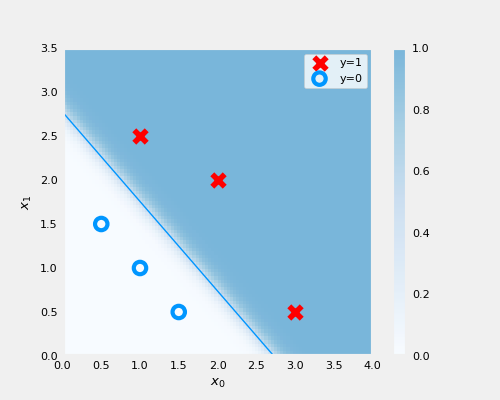

In [20]:
fig,ax = plt.subplots(1,1,figsize=(5,4))
# plot the probability 
plt_prob(ax, w_out, b_out)

# Plot the original data
ax.set_ylabel(r'$x_1$')
ax.set_xlabel(r'$x_0$')   
ax.axis([0, 4, 0, 3.5])
plot_data(X_train,y_train,ax)

# Plot the decision boundary
x0 = -b_out/w_out[0]
x1 = -b_out/w_out[1]
ax.plot([0,x0],[x1,0], c=dlc["dlblue"], lw=1)
plt.show()

In the plot above:
 - the shading reflects the probability y=1 (result prior to decision boundary)
 - the decision boundary is the line at which the probability = 0.5
 

## Another Data set
Let's return to a one-variable data set. With just two parameters, $w$, $b$, it is possible to plot the cost function using a contour plot to get a better idea of what gradient descent is up to.

In [21]:
x_train = np.array([0., 1, 2, 3, 4, 5])
y_train = np.array([0,  0, 0, 1, 1, 1])

As before, we'll use a helper function to plot this data. The data points with label $y=1$ are shown as red crosses, while the data points with label $y=0$ are shown as blue circles.

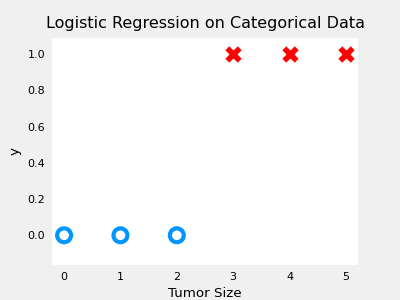

In [22]:
fig,ax = plt.subplots(1,1,figsize=(4,3))
plt_tumor_data(x_train, y_train, ax)
plt.show()

In the plot below, try:
- changing $w$ and $b$ by clicking within the contour plot on the upper right.
    - changes may take a second or two
    - note the changing value of cost on the upper left plot.
    - note the cost is accumulated by a loss on each example (vertical dotted lines)
- run gradient descent by clicking the orange button.
    - note the steadily decreasing cost (contour and cost plot are in log(cost) 
    - clicking in the contour plot will reset the model for a new run
- to reset the plot, rerun the cell

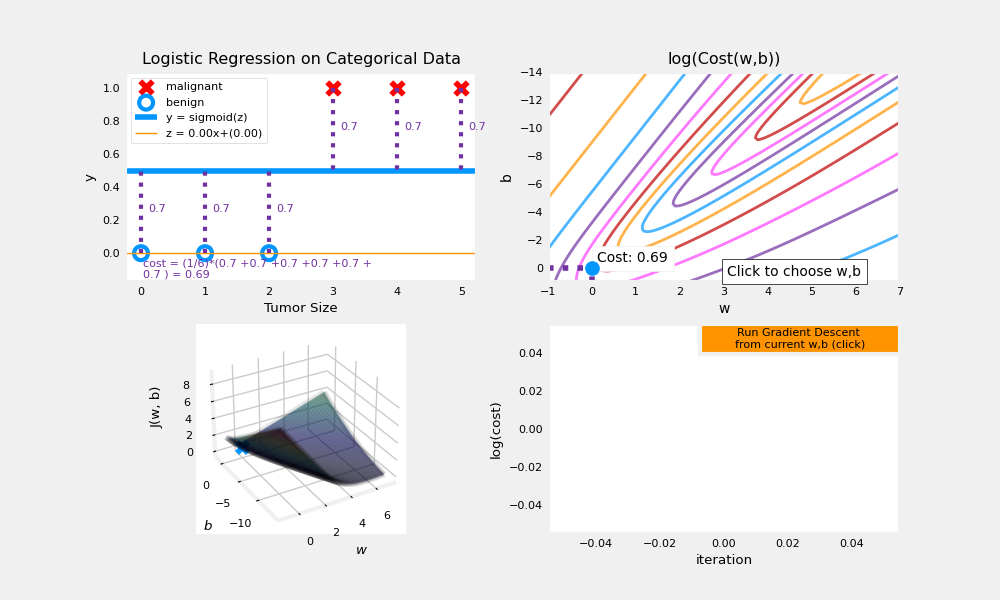

In [23]:
w_range = np.array([-1, 7])
b_range = np.array([1, -14])
quad = plt_quad_logistic( x_train, y_train, w_range, b_range )

## Congratulations!
You have:
- examined the formulas and implementation of calculating the gradient for logistic regression
- utilized those routines in
    - exploring a single variable data set
    - exploring a two-variable data set